# Government720 Data Scaling and Noisy Interpolation
After an attempt to interpolate the data using Akima spline, due to the smoothness of the data not matching up with the GAN extrapolation this notebook is for interpolating using random noise, which will be more suitable for GAN-generated extrapolation.

### CLIENT 1

In [1]:
# Import pandas
import pandas as pd

# Access Google Drive for Excel file
from google.colab import drive
drive.mount('/content/drive')

# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT1_ECONOMY', engine='openpyxl')

# Display the first few rows
print(df.head())

Mounted at /content/drive
              DATE  UNEMPLOYMENT_RATE  INFLATION_RATE   GDP  HOUSING_AFFORD  \
0  Week-1-Jan-2000                NaN             2.7  10.0             NaN   
1  Week-2-Jan-2000                NaN             NaN   NaN             NaN   
2  Week-3-Jan-2000                NaN             NaN   NaN             NaN   
3  Week-4-Jan-2000                NaN             NaN   NaN             NaN   
4  Week-1-Feb-2000                NaN             3.2   NaN             NaN   

   MIN_WAGE  POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  ...  PAYROLL_TAX  \
0      5.15           8.4        22.7        19.2      NaN  ...         3.93   
1       NaN           NaN         NaN         NaN      NaN  ...          NaN   
2       NaN           NaN         NaN         NaN      NaN  ...          NaN   
3       NaN           NaN         NaN         NaN      NaN  ...          NaN   
4       NaN           NaN         NaN         NaN      NaN  ...          NaN   

   CORPORATE_TAX  

In [2]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  UNEMPLOYMENT_RATE  INFLATION_RATE   GDP  HOUSING_AFFORD  \
0 2000-01-01                NaN             2.7  10.0             NaN   
1 2000-01-02                NaN             NaN   NaN             NaN   
2 2000-01-03                NaN             NaN   NaN             NaN   
3 2000-01-04                NaN             NaN   NaN             NaN   
4 2000-02-01                NaN             3.2   NaN             NaN   

   MIN_WAGE  POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  ...  PAYROLL_TAX  \
0      5.15           8.4        22.7        19.2      NaN  ...         3.93   
1       NaN           NaN         NaN         NaN      NaN  ...          NaN   
2       NaN           NaN         NaN         NaN      NaN  ...          NaN   
3       NaN           NaN         NaN         NaN      NaN  ...          NaN   
4       NaN           NaN         NaN         NaN      NaN  ...          NaN   

   CORPORATE_TAX  CORPORATE_PROFIT  TOP1_WEALTH  FICO_SCORE  \
0           1.24 

In [3]:
# Display data types of all columns in the DataFrame
print(df.dtypes)

# Convert 'CORPORATE_PROFIT' column from object to float64
df['CORPORATE_PROFIT'] = pd.to_numeric(df['CORPORATE_PROFIT'], errors='coerce')

# Verify the change
print(df['CORPORATE_PROFIT'].dtype)

DATE                     datetime64[ns]
UNEMPLOYMENT_RATE               float64
INFLATION_RATE                  float64
GDP                             float64
HOUSING_AFFORD                  float64
MIN_WAGE                        float64
POVERTY_WAGE                    float64
GENDER_GAP                      float64
RACIAL_GAP                      float64
DEFICIT                         float64
SS_RECIPIENTS                   float64
CPI                             float64
MEDIAN_WAGE                     float64
MANU_JOBS                       float64
UNION_MEMBERS                   float64
JOBS_ADDED                      float64
POVERTY_RATE                    float64
FED_EMPLOY                      float64
GAO_HIGH_RISK                   float64
INCOME_TAX                      float64
PAYROLL_TAX                     float64
CORPORATE_TAX                   float64
CORPORATE_PROFIT                 object
TOP1_WEALTH                     float64
FICO_SCORE                      float64


In [4]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      UNEMPLOYMENT_RATE  INFLATION_RATE   GDP  HOUSING_AFFORD  MIN_WAGE  \
0                   NaN             2.7  10.0             NaN      5.15   
1                   NaN             NaN   NaN             NaN       NaN   
2                   NaN             NaN   NaN             NaN       NaN   
3                   NaN             NaN   NaN             NaN       NaN   
4                   NaN             3.2   NaN             NaN       NaN   
...                 ...             ...   ...             ...       ...   
1295                4.1             2.9   NaN             NaN       NaN   
1296                NaN             NaN   NaN             NaN       NaN   
1297                NaN             NaN   NaN             NaN       NaN   
1298                NaN             NaN   NaN             NaN       NaN   
1299                4.0             NaN   NaN             NaN       NaN   

      POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  SS_RECIPIENTS  ...  \
0              8.4      

In [5]:
# Use min-max scaling to scale data (this is needed to have multivariate time series on same plane)
from sklearn.preprocessing import MinMaxScaler

# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [6]:
# Import numpy
import numpy as np

# Function to interpolate time series with some random noise
def fill_time_series(df_scaled):
    # Iterate over each time series column
    for column in df_scaled.columns:
        # Find indices of non-null values
        non_null_indices = df_scaled[column].dropna().index
        # Loop through each pair of non-null indices
        for i in range(len(non_null_indices) - 1):
            start_idx = non_null_indices[i]
            end_idx = non_null_indices[i + 1]

            # Get the known values at these indices
            start_value = df_scaled[column].iloc[start_idx]
            end_value = df_scaled[column].iloc[end_idx]

            # Create a linear interpolator between these two points
            num_steps = end_idx - start_idx  # Number of steps to fill
            if num_steps <= 1:
                continue  # Skip if no room to interpolate (e.g., consecutive non-null values)

            linear_interp = np.linspace(start_value, end_value, num_steps) # Still trend in direction of known values

            # Add random jaggedness
            # Use 0 as mean, + or - mean will result in shift of all values
            # Use 0.01 noise as with data now scaled, this should still follow trends in data with some variation (esp with weekly data there is not expected to be much variation per observation)
            random_noise = np.random.normal(0, 0.01, size=num_steps)
            jagged_line = linear_interp + random_noise

            # Ensure the length of jagged_line matches the length of the index range
            df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame

    return df_scaled

# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


      UNEMPLOYMENT_RATE  INFLATION_RATE       GDP  HOUSING_AFFORD  MIN_WAGE  \
0                   NaN        0.428571  0.000000             NaN  0.000000   
1                   NaN        0.439460 -0.006451             NaN -0.015130   
2                   NaN        0.461814  0.020851             NaN  0.002986   
3                   NaN        0.466160  0.023599             NaN -0.012395   
4                   NaN        0.473214 -0.014477             NaN -0.006515   
...                 ...             ...       ...             ...       ...   
1295           0.061404        0.446429       NaN             NaN       NaN   
1296           0.068841             NaN       NaN             NaN       NaN   
1297           0.056386             NaN       NaN             NaN       NaN   
1298           0.047830             NaN       NaN             NaN       NaN   
1299           0.052632             NaN       NaN             NaN       NaN   

      POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT

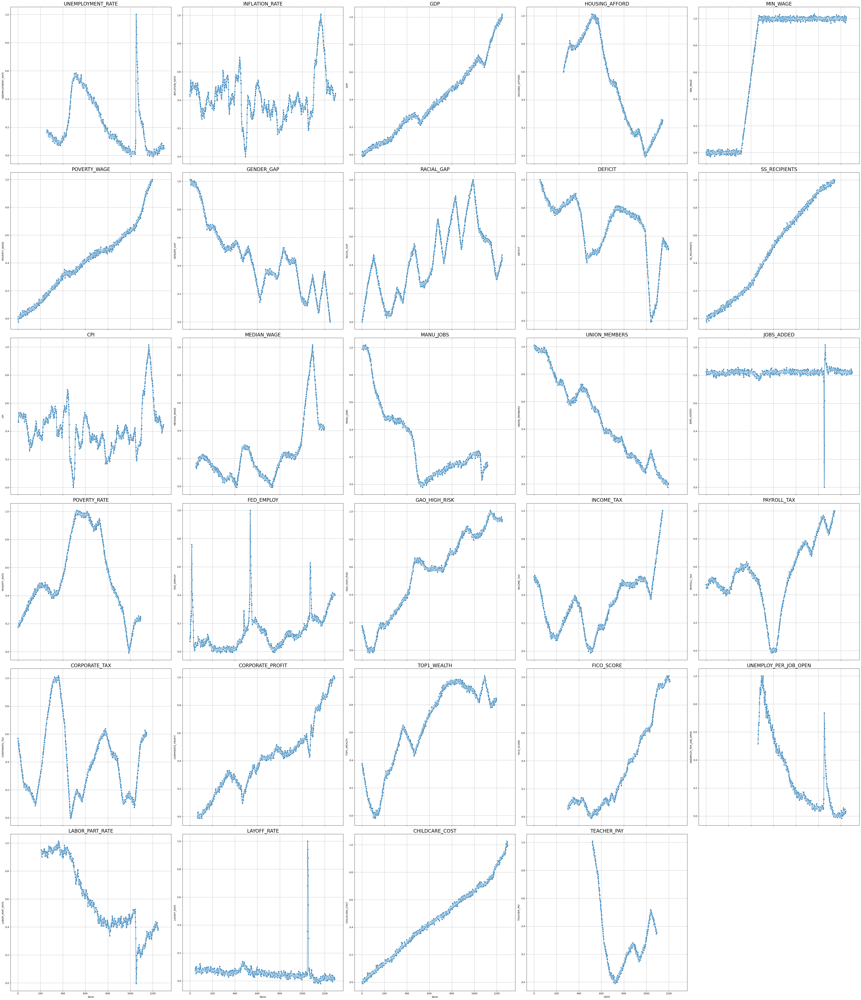

In [7]:
# Make multi-graph chart of scaled time series variables to verify interpolation method is good
# Import packages
import seaborn as sns
import matplotlib.pyplot as plt

# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

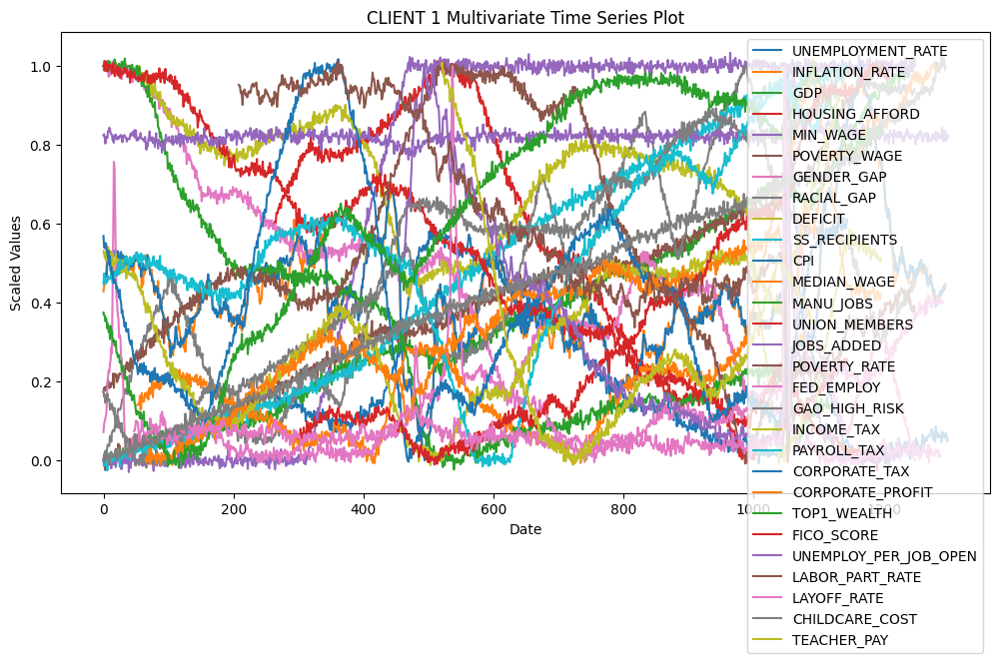

In [8]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 1 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [9]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT1_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT1_Noisy_Interpolated.xlsx


### CLIENT 2

In [10]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT2_MEDIA', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  \
0  Week-1-Jan-2000         55.0           NaN            NaN          NaN   
1  Week-2-Jan-2000          NaN           NaN            NaN          NaN   
2  Week-3-Jan-2000          NaN           NaN            NaN          NaN   
3  Week-4-Jan-2000          NaN           NaN            NaN          NaN   
4  Week-1-Feb-2000          NaN           NaN            NaN          NaN   

   FACT_CHECKERS  MISINFORMATION_MENTIONS  
0            NaN                      NaN  
1            NaN                      NaN  
2            NaN                      NaN  
3            NaN                      NaN  
4            NaN                      NaN  


In [11]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  \
0 2000-01-01         55.0           NaN            NaN          NaN   
1 2000-01-02          NaN           NaN            NaN          NaN   
2 2000-01-03          NaN           NaN            NaN          NaN   
3 2000-01-04          NaN           NaN            NaN          NaN   
4 2000-02-01          NaN           NaN            NaN          NaN   

   FACT_CHECKERS  MISINFORMATION_MENTIONS  
0            NaN                      NaN  
1            NaN                      NaN  
2            NaN                      NaN  
3            NaN                      NaN  
4            NaN                      NaN  


In [12]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0            55.0           NaN            NaN          NaN            NaN   
1             NaN           NaN            NaN          NaN            NaN   
2             NaN           NaN            NaN          NaN            NaN   
3             NaN           NaN            NaN          NaN            NaN   
4             NaN           NaN            NaN          NaN            NaN   
...           ...           ...            ...          ...            ...   
1295          NaN           NaN            NaN          NaN            NaN   
1296          NaN           NaN            NaN          NaN            NaN   
1297          NaN           NaN            NaN          NaN            NaN   
1298          NaN           NaN            NaN          NaN            NaN   
1299         31.0           NaN            NaN          NaN            NaN   

      MISINFORMATION_MENTIONS  
0                         NaN  

In [13]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [14]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0        1.000000           NaN            NaN          NaN            NaN   
1        1.000805           NaN            NaN          NaN            NaN   
2        0.980042           NaN            NaN          NaN            NaN   
3        0.981156           NaN            NaN          NaN            NaN   
4        0.994488           NaN            NaN          NaN            NaN   
...           ...           ...            ...          ...            ...   
1295     0.000853           NaN            NaN          NaN            NaN   
1296    -0.004781           NaN            NaN          NaN            NaN   
1297     0.023673           NaN            NaN          NaN            NaN   
1298    -0.002152           NaN            NaN          NaN            NaN   
1299     0.000000           NaN            NaN          NaN            NaN   

      MISINFORMATION_MENTIONS  
0                         NaN  

<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


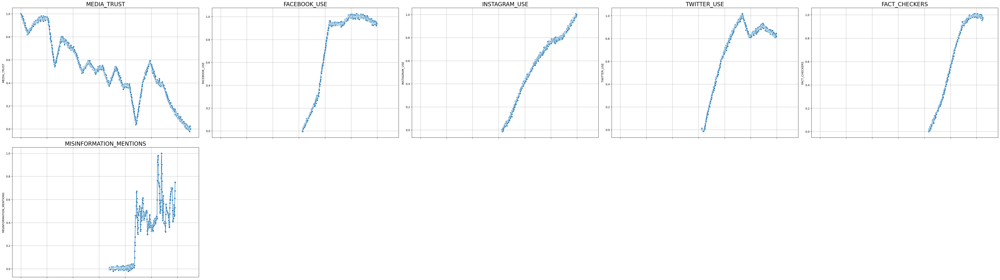

In [16]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

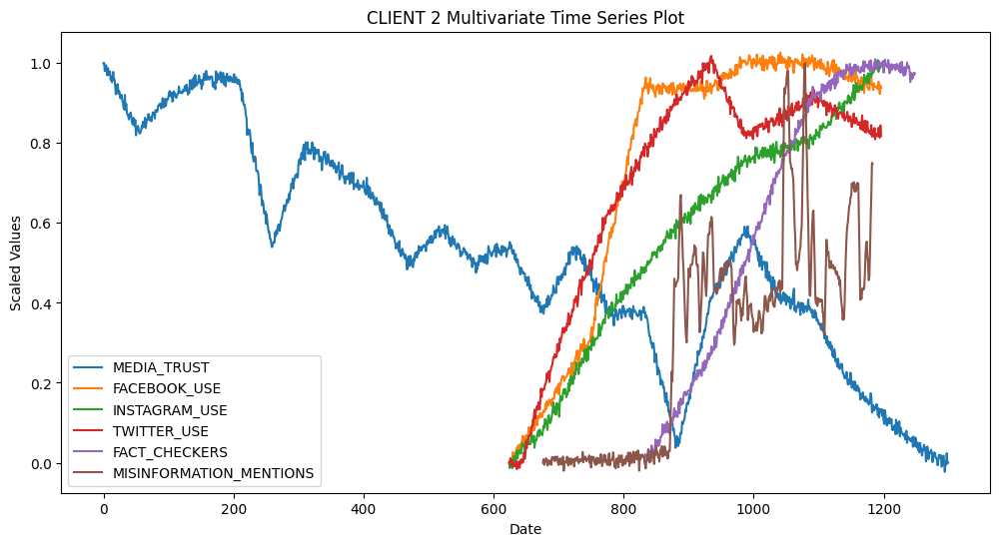

In [17]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 2 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [18]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT2_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT2_Noisy_Interpolated.xlsx


### CLIENT 3

In [19]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT3_HEALTH', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE  \
0  Week-1-Jan-2000            10.3                  6.1              86.9   
1  Week-2-Jan-2000             NaN                  NaN               NaN   
2  Week-3-Jan-2000             NaN                  NaN               NaN   
3  Week-4-Jan-2000             NaN                  NaN               NaN   
4  Week-1-Feb-2000             NaN                  NaN               NaN   

   SUICIDE  OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0     10.4           NaN        NaN                  NaN         8407.0   
1      NaN           NaN        NaN                  NaN            NaN   
2      NaN           NaN        NaN                  NaN            NaN   
3      NaN           NaN        NaN                  NaN            NaN   
4      NaN           NaN        NaN                  NaN            NaN   

   OPIOID_PRESCRIP  ...  ALCOHOL_TREATMENT  OPIOID_TREATMENT  IVF_BABIES  \
0         

In [20]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE  SUICIDE  \
0 2000-01-01            10.3                  6.1              86.9     10.4   
1 2000-01-02             NaN                  NaN               NaN      NaN   
2 2000-01-03             NaN                  NaN               NaN      NaN   
3 2000-01-04             NaN                  NaN               NaN      NaN   
4 2000-02-01             NaN                  NaN               NaN      NaN   

   OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0           NaN        NaN                  NaN         8407.0   
1           NaN        NaN                  NaN            NaN   
2           NaN        NaN                  NaN            NaN   
3           NaN        NaN                  NaN            NaN   
4           NaN        NaN                  NaN            NaN   

   OPIOID_PRESCRIP  ...  ALCOHOL_TREATMENT  OPIOID_TREATMENT  IVF_BABIES  \
0              NaN  ...                NaN    

In [21]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE  SUICIDE  \
0               10.3                  6.1              86.9     10.4   
1                NaN                  NaN               NaN      NaN   
2                NaN                  NaN               NaN      NaN   
3                NaN                  NaN               NaN      NaN   
4                NaN                  NaN               NaN      NaN   
...              ...                  ...               ...      ...   
1295             NaN                  NaN               NaN      NaN   
1296             NaN                  NaN               NaN      NaN   
1297             NaN                  NaN               NaN      NaN   
1298             NaN                  NaN               NaN      NaN   
1299             NaN                  NaN               NaN      NaN   

      OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0              NaN        NaN                  NaN         8407.0 

In [22]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [23]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE   SUICIDE  \
0           0.065217             0.000000          0.380952  0.000000   
1           0.090339             0.009411          0.391167 -0.014257   
2           0.058582            -0.003475          0.392390  0.001535   
3           0.078690             0.002548          0.383615  0.012880   
4           0.078848             0.003193          0.389130  0.011458   
...              ...                  ...               ...       ...   
1295             NaN                  NaN               NaN       NaN   
1296             NaN                  NaN               NaN       NaN   
1297             NaN                  NaN               NaN       NaN   
1298             NaN                  NaN               NaN       NaN   
1299             NaN                  NaN               NaN       NaN   

      OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0              NaN        NaN                  NaN    

<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


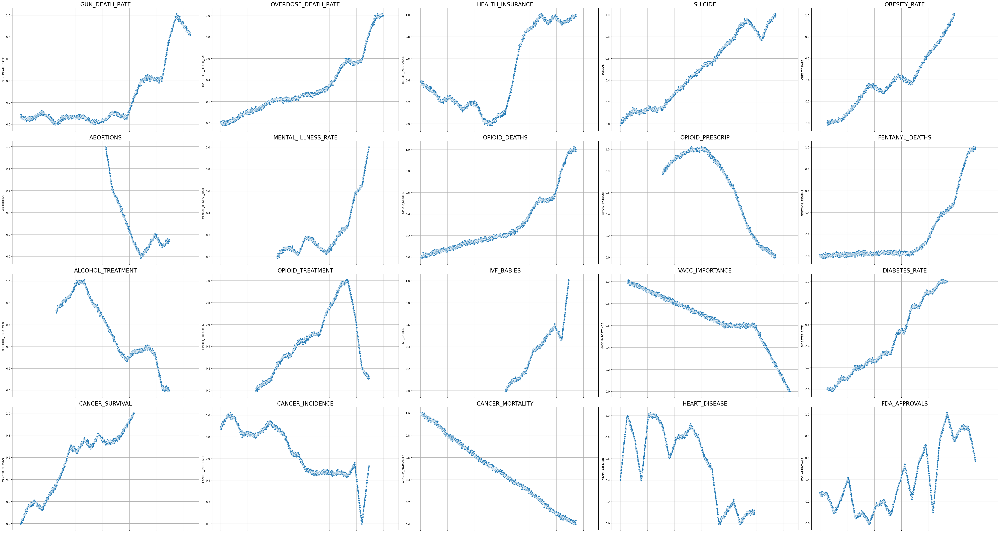

In [24]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

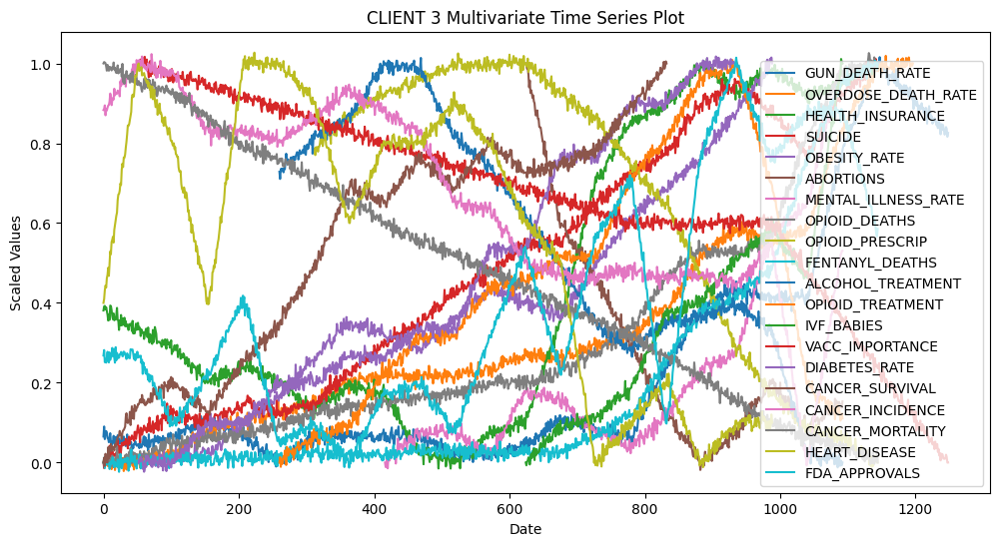

In [25]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 3 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [26]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT3_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT3_Noisy_Interpolated.xlsx


### CLIENT 4

In [27]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT4_ELECTIONS', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  \
0  Week-1-Jan-2000       11.21           53.0                     NaN   
1  Week-2-Jan-2000         NaN            NaN                     NaN   
2  Week-3-Jan-2000         NaN            NaN                     NaN   
3  Week-4-Jan-2000         NaN            NaN                     NaN   
4  Week-1-Feb-2000         NaN            NaN                     NaN   

   CLOTURE_MOTIONS  ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0              NaN            NaN               NaN                 NaN   
1              NaN            NaN               NaN                 NaN   
2              NaN            NaN               NaN                 NaN   
3              NaN            NaN               NaN                 NaN   
4              NaN            NaN               NaN                 NaN   

   PARTISAN_GAP_SENATE  HOUSE_LEANING  SENATE_LEANING  
0                  NaN            NaN             NaN 

In [28]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  \
0 2000-01-01       11.21           53.0                     NaN   
1 2000-01-02         NaN            NaN                     NaN   
2 2000-01-03         NaN            NaN                     NaN   
3 2000-01-04         NaN            NaN                     NaN   
4 2000-02-01         NaN            NaN                     NaN   

   CLOTURE_MOTIONS  ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0              NaN            NaN               NaN                 NaN   
1              NaN            NaN               NaN                 NaN   
2              NaN            NaN               NaN                 NaN   
3              NaN            NaN               NaN                 NaN   
4              NaN            NaN               NaN                 NaN   

   PARTISAN_GAP_SENATE  HOUSE_LEANING  SENATE_LEANING  
0                  NaN            NaN             NaN  
1                  NaN            

In [29]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0          11.21           53.0                     NaN              NaN   
1            NaN            NaN                     NaN              NaN   
2            NaN            NaN                     NaN              NaN   
3            NaN            NaN                     NaN              NaN   
4            NaN            NaN                     NaN              NaN   
...          ...            ...                     ...              ...   
1295         NaN            NaN                     NaN              NaN   
1296         NaN            NaN                     NaN              NaN   
1297         NaN            NaN                     NaN              NaN   
1298         NaN            NaN                     NaN              NaN   
1299         NaN            NaN                     NaN            266.0   

      ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0               NaN       

In [30]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [31]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0       0.023149       0.705882                     NaN              NaN   
1       0.034879       0.701109                     NaN              NaN   
2       0.024606       0.677900                     NaN              NaN   
3       0.031582       0.684180                     NaN              NaN   
4       0.032320       0.649366                     NaN              NaN   
...          ...            ...                     ...              ...   
1295         NaN            NaN                     NaN         0.753365   
1296         NaN            NaN                     NaN         0.755617   
1297         NaN            NaN                     NaN         0.750935   
1298         NaN            NaN                     NaN         0.727209   
1299         NaN            NaN                     NaN         0.744526   

      ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0               NaN       

<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


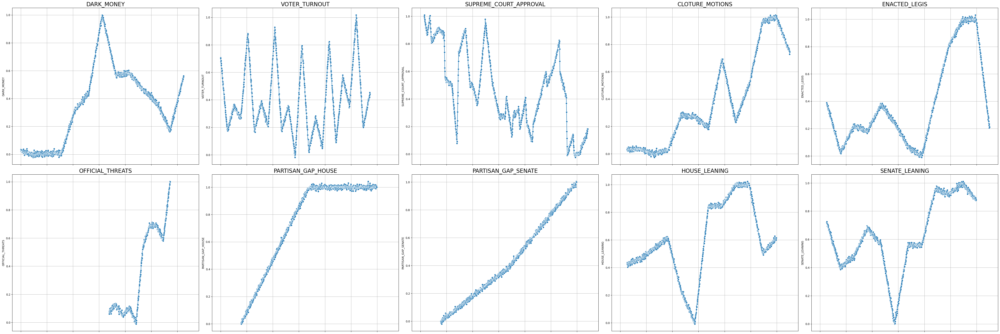

In [33]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 5*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

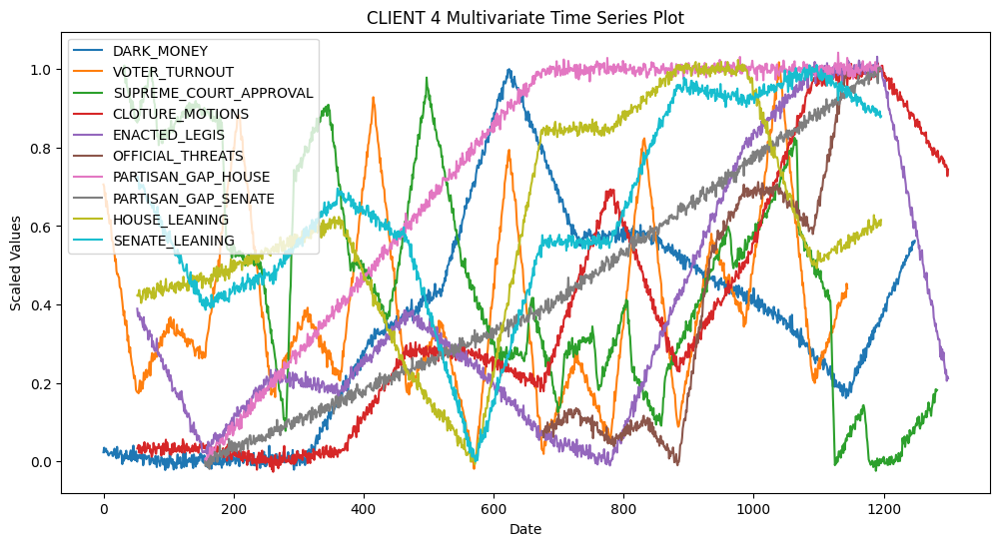

In [34]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 4 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [35]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT4_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT4_Noisy_Interpolated.xlsx


### CLIENT 5

In [36]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT5_EDUCATION', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  \
0  Week-1-Jan-2000          3349.0          14616.0      15312289.0   
1  Week-2-Jan-2000             NaN              NaN             NaN   
2  Week-3-Jan-2000             NaN              NaN             NaN   
3  Week-4-Jan-2000             NaN              NaN             NaN   
4  Week-1-Feb-2000             NaN              NaN             NaN   

   LOAN_DEBT  READING_PROF  MATH_PROF  
0        NaN          32.5       26.0  
1        NaN           NaN        NaN  
2        NaN           NaN        NaN  
3        NaN           NaN        NaN  
4        NaN           NaN        NaN  


In [37]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  \
0 2000-01-01          3349.0          14616.0      15312289.0        NaN   
1 2000-01-02             NaN              NaN             NaN        NaN   
2 2000-01-03             NaN              NaN             NaN        NaN   
3 2000-01-04             NaN              NaN             NaN        NaN   
4 2000-02-01             NaN              NaN             NaN        NaN   

   READING_PROF  MATH_PROF  
0          32.5       26.0  
1           NaN        NaN  
2           NaN        NaN  
3           NaN        NaN  
4           NaN        NaN  


In [38]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  \
0             3349.0          14616.0      15312289.0        NaN   
1                NaN              NaN             NaN        NaN   
2                NaN              NaN             NaN        NaN   
3                NaN              NaN             NaN        NaN   
4                NaN              NaN             NaN        NaN   
...              ...              ...             ...        ...   
1295             NaN              NaN             NaN        NaN   
1296             NaN              NaN             NaN        NaN   
1297             NaN              NaN             NaN        NaN   
1298             NaN              NaN             NaN        NaN   
1299             NaN              NaN             NaN       1.77   

      READING_PROF  MATH_PROF  
0             32.5       26.0  
1              NaN        NaN  
2              NaN        NaN  
3              NaN        NaN  
4              NaN     

In [39]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [40]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  \
0           0.000000         0.000000        0.000000        NaN   
1          -0.006552         0.003497        0.003064        NaN   
2           0.022798        -0.010235        0.026125        NaN   
3           0.003382         0.005894        0.013857        NaN   
4           0.008888        -0.001661        0.033394        NaN   
...              ...              ...             ...        ...   
1295             NaN              NaN             NaN   1.006990   
1296             NaN              NaN             NaN   1.018019   
1297             NaN              NaN             NaN   0.998280   
1298             NaN              NaN             NaN   1.016240   
1299             NaN              NaN             NaN   1.000000   

      READING_PROF  MATH_PROF  
0         0.300000   0.000000  
1         0.299539  -0.013301  
2         0.302126   0.010318  
3         0.304973   0.020458  
4         0.312796   0.

<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


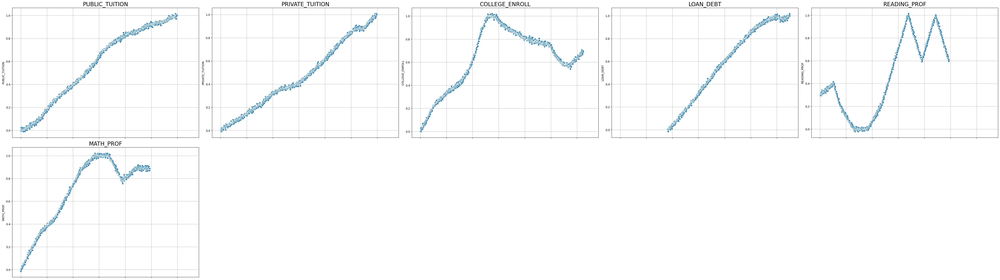

In [41]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

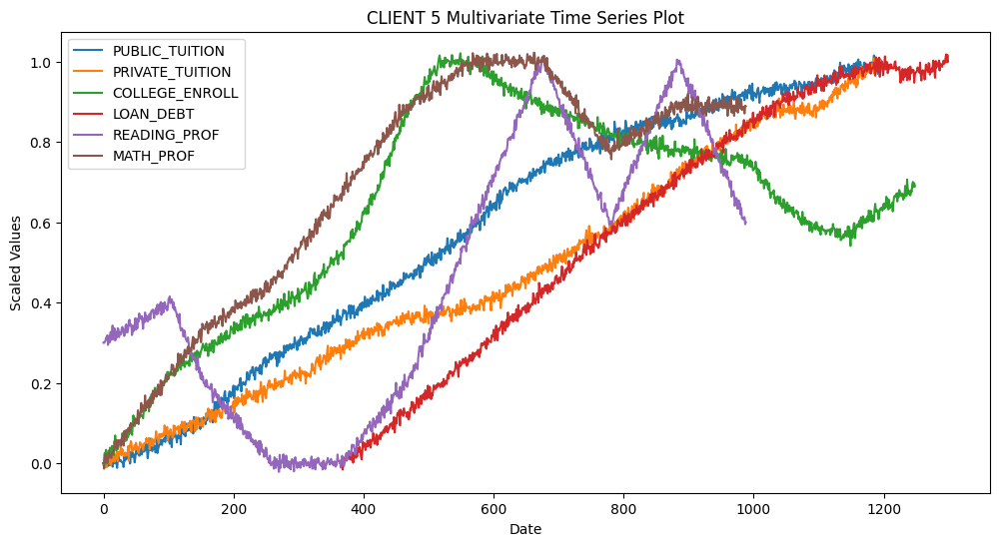

In [42]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 5 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [43]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT5_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT5_Noisy_Interpolated.xlsx


### CLIENT 6

In [44]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT6_ENVIRONMENT', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  \
0  Week-1-Jan-2000     12.45        19.34         4.2           37.73   
1  Week-2-Jan-2000       NaN          NaN         NaN             NaN   
2  Week-3-Jan-2000       NaN          NaN         NaN             NaN   
3  Week-4-Jan-2000       NaN          NaN         NaN             NaN   
4  Week-1-Feb-2000       NaN          NaN         NaN             NaN   

   NATGAS_CONSUMP  RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  \
0           22.91            4.2       7.37           9350.0   
1             NaN            NaN        NaN              NaN   
2             NaN            NaN        NaN              NaN   
3             NaN            NaN        NaN              NaN   
4             NaN            NaN        NaN              NaN   

   ELECTRIC_VEHICLES  FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0                0.0         0.8607                5.0          1.86  
1                NaN            Na

In [45]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  \
0 2000-01-01     12.45        19.34         4.2           37.73   
1 2000-01-02       NaN          NaN         NaN             NaN   
2 2000-01-03       NaN          NaN         NaN             NaN   
3 2000-01-04       NaN          NaN         NaN             NaN   
4 2000-02-01       NaN          NaN         NaN             NaN   

   NATGAS_CONSUMP  RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  \
0           22.91            4.2       7.37           9350.0   
1             NaN            NaN        NaN              NaN   
2             NaN            NaN        NaN              NaN   
3             NaN            NaN        NaN              NaN   
4             NaN            NaN        NaN              NaN   

   ELECTRIC_VEHICLES  FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0                0.0         0.8607                5.0          1.86  
1                NaN            NaN                NaN           NaN  

In [46]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0        12.45        19.34         4.2           37.73           22.91   
1          NaN          NaN         NaN             NaN             NaN   
2          NaN          NaN         NaN             NaN             NaN   
3          NaN          NaN         NaN             NaN             NaN   
4          NaN          NaN         NaN             NaN             NaN   
...        ...          ...         ...             ...             ...   
1295       NaN          NaN         NaN             NaN             NaN   
1296       NaN          NaN         NaN             NaN             NaN   
1297       NaN          NaN         NaN             NaN             NaN   
1298       NaN          NaN         NaN             NaN             NaN   
1299       NaN          NaN         NaN             NaN             NaN   

      RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0               4.2       7.3

In [47]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [48]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0     0.113300     0.037699    0.140244        0.684411        0.058927   
1     0.109691     0.042296    0.115733        0.686080        0.061647   
2     0.116058     0.051494    0.137692        0.701297        0.041437   
3     0.100838     0.040681    0.128553        0.706069        0.033212   
4     0.116816     0.040807    0.123539        0.686636        0.069543   
...        ...          ...         ...             ...             ...   
1295       NaN          NaN         NaN             NaN             NaN   
1296       NaN          NaN         NaN             NaN             NaN   
1297       NaN          NaN         NaN             NaN             NaN   
1298       NaN          NaN         NaN             NaN             NaN   
1299       NaN          NaN         NaN             NaN             NaN   

      RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0          0.145877   0.90540

<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


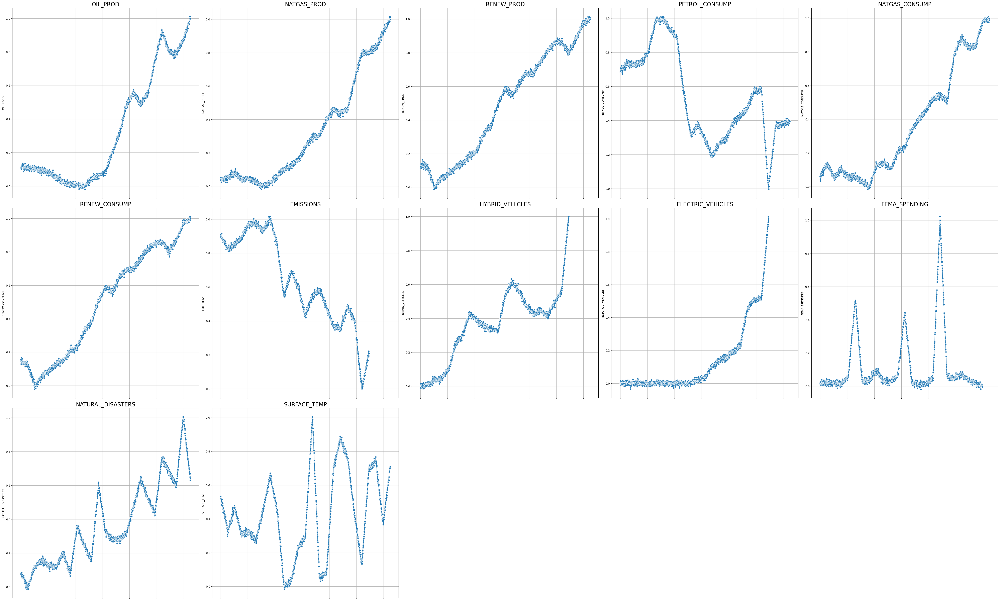

In [49]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 5*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

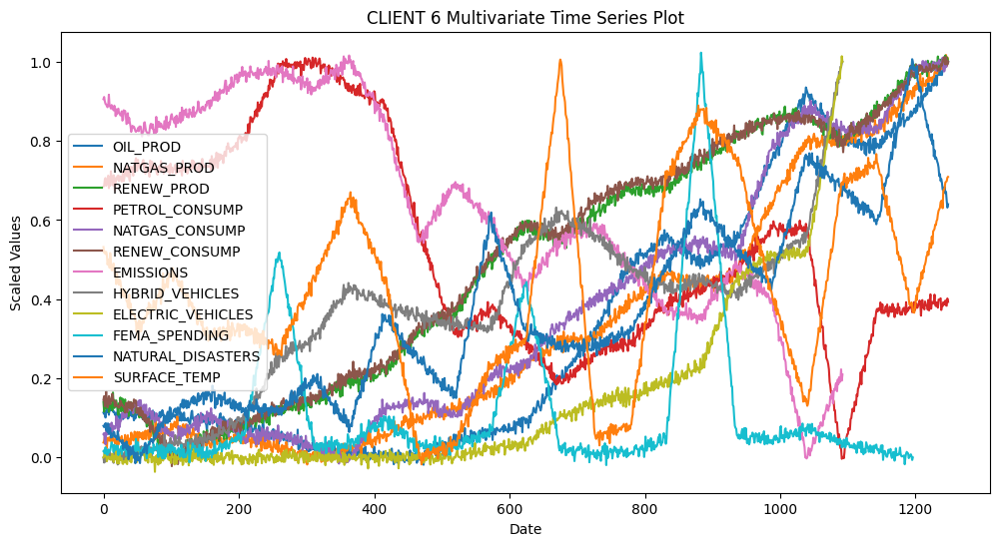

In [50]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 6 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [51]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT6_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT6_Noisy_Interpolated.xlsx


### CLIENT 7

In [52]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT7_IMMIGRATION', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  \
0  Week-1-Jan-2000                NaN     31107889.0         8460000.0   
1  Week-2-Jan-2000                NaN            NaN               NaN   
2  Week-3-Jan-2000                NaN            NaN               NaN   
3  Week-4-Jan-2000                NaN            NaN               NaN   
4  Week-1-Feb-2000                NaN            NaN               NaN   

   BORDER_SPENDING  DEPORTATIONS  ASYLUM_APPS  
0              6.9           NaN          NaN  
1              NaN           NaN          NaN  
2              NaN           NaN          NaN  
3              NaN           NaN          NaN  
4              NaN           NaN          NaN  


In [53]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  \
0 2000-01-01                NaN     31107889.0         8460000.0   
1 2000-01-02                NaN            NaN               NaN   
2 2000-01-03                NaN            NaN               NaN   
3 2000-01-04                NaN            NaN               NaN   
4 2000-02-01                NaN            NaN               NaN   

   BORDER_SPENDING  DEPORTATIONS  ASYLUM_APPS  
0              6.9           NaN          NaN  
1              NaN           NaN          NaN  
2              NaN           NaN          NaN  
3              NaN           NaN          NaN  
4              NaN           NaN          NaN  


In [54]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                   NaN     31107889.0         8460000.0              6.9   
1                   NaN            NaN               NaN              NaN   
2                   NaN            NaN               NaN              NaN   
3                   NaN            NaN               NaN              NaN   
4                   NaN            NaN               NaN              NaN   
...                 ...            ...               ...              ...   
1295                NaN            NaN               NaN              NaN   
1296                NaN            NaN               NaN              NaN   
1297                NaN            NaN               NaN              NaN   
1298                NaN            NaN               NaN              NaN   
1299                NaN            NaN               NaN              NaN   

      DEPORTATIONS  ASYLUM_APPS  
0              NaN          NaN  
1      

In [55]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [56]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                   NaN       0.000000          0.000000         0.005805   
1                   NaN       0.020830         -0.010088         0.017746   
2                   NaN      -0.010507          0.023193         0.024890   
3                   NaN       0.013128          0.006863         0.015608   
4                   NaN      -0.011326          0.021793         0.003084   
...                 ...            ...               ...              ...   
1295                NaN            NaN               NaN              NaN   
1296                NaN            NaN               NaN              NaN   
1297                NaN            NaN               NaN              NaN   
1298                NaN            NaN               NaN              NaN   
1299                NaN            NaN               NaN              NaN   

      DEPORTATIONS  ASYLUM_APPS  
0              NaN          NaN  
1      

<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


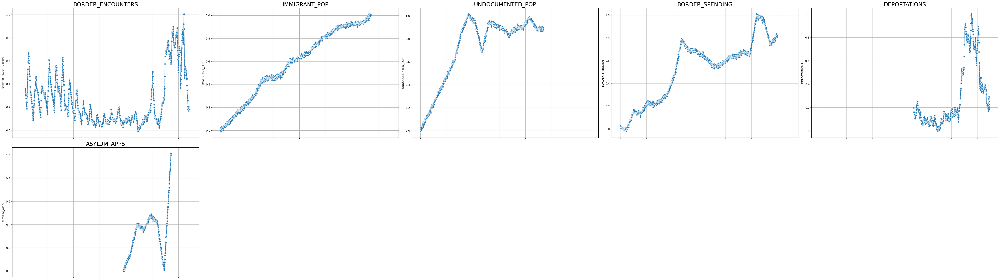

In [57]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

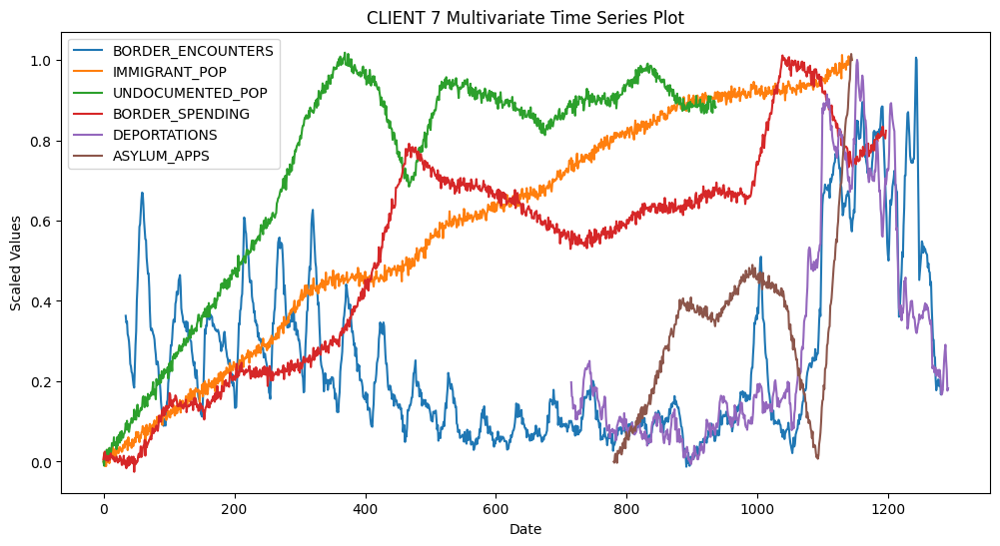

In [58]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 7 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [59]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT7_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT7_Noisy_Interpolated.xlsx


### CLIENT 8

In [60]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT8_POPULATION', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  \
0  Week-1-Jan-2000             NaN           NaN            65.9   
1  Week-2-Jan-2000             NaN           NaN             NaN   
2  Week-3-Jan-2000             NaN           NaN             NaN   
3  Week-4-Jan-2000             NaN           NaN             NaN   
4  Week-1-Feb-2000             NaN           NaN             NaN   

   USA_POPULATION  WHITE_POP  HISPANIC_POP  BLACK_POP  AAPI_POP  \
0     282171936.0       69.4          12.6       12.2       3.8   
1             NaN        NaN           NaN        NaN       NaN   
2             NaN        NaN           NaN        NaN       NaN   
3             NaN        NaN           NaN        NaN       NaN   
4             NaN        NaN           NaN        NaN       NaN   

   CHRISTIAN_POP  NON_RELIGIOUS_POP  
0           86.0                8.0  
1            NaN                NaN  
2            NaN                NaN  
3            NaN                NaN 

In [61]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  \
0 2000-01-01             NaN           NaN            65.9     282171936.0   
1 2000-01-02             NaN           NaN             NaN             NaN   
2 2000-01-03             NaN           NaN             NaN             NaN   
3 2000-01-04             NaN           NaN             NaN             NaN   
4 2000-02-01             NaN           NaN             NaN             NaN   

   WHITE_POP  HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  \
0       69.4          12.6       12.2       3.8           86.0   
1        NaN           NaN        NaN       NaN            NaN   
2        NaN           NaN        NaN       NaN            NaN   
3        NaN           NaN        NaN       NaN            NaN   
4        NaN           NaN        NaN       NaN            NaN   

   NON_RELIGIOUS_POP  
0                8.0  
1                NaN  
2                NaN  
3                NaN  
4                Na

In [62]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0                NaN           NaN            65.9     282171936.0       69.4   
1                NaN           NaN             NaN             NaN        NaN   
2                NaN           NaN             NaN             NaN        NaN   
3                NaN           NaN             NaN             NaN        NaN   
4                NaN           NaN             NaN             NaN        NaN   
...              ...           ...             ...             ...        ...   
1295             NaN           NaN             NaN             NaN        NaN   
1296             NaN           NaN             NaN             NaN        NaN   
1297             NaN           NaN             NaN             NaN        NaN   
1298             NaN           NaN             NaN             NaN        NaN   
1299             NaN           NaN             NaN             NaN        NaN   

      HISPANIC_POP  BLACK_P

In [63]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [64]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0                NaN           NaN        0.770270        0.000000   1.000000   
1                NaN           NaN        0.773236       -0.002098   0.987528   
2                NaN           NaN        0.767205       -0.009087   0.994172   
3                NaN           NaN        0.771403        0.002883   0.996362   
4                NaN           NaN        0.771093        0.016500   1.000172   
...              ...           ...             ...             ...        ...   
1295             NaN           NaN             NaN             NaN        NaN   
1296             NaN           NaN             NaN             NaN        NaN   
1297             NaN           NaN             NaN             NaN        NaN   
1298             NaN           NaN             NaN             NaN        NaN   
1299             NaN           NaN             NaN             NaN        NaN   

      HISPANIC_POP  BLACK_P

<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


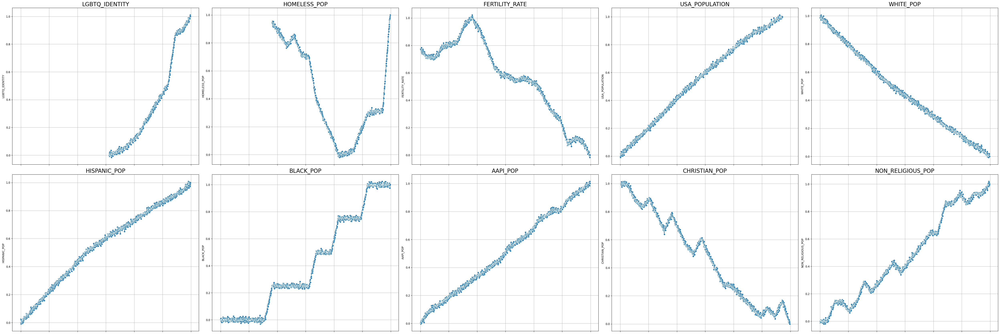

In [65]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 5*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

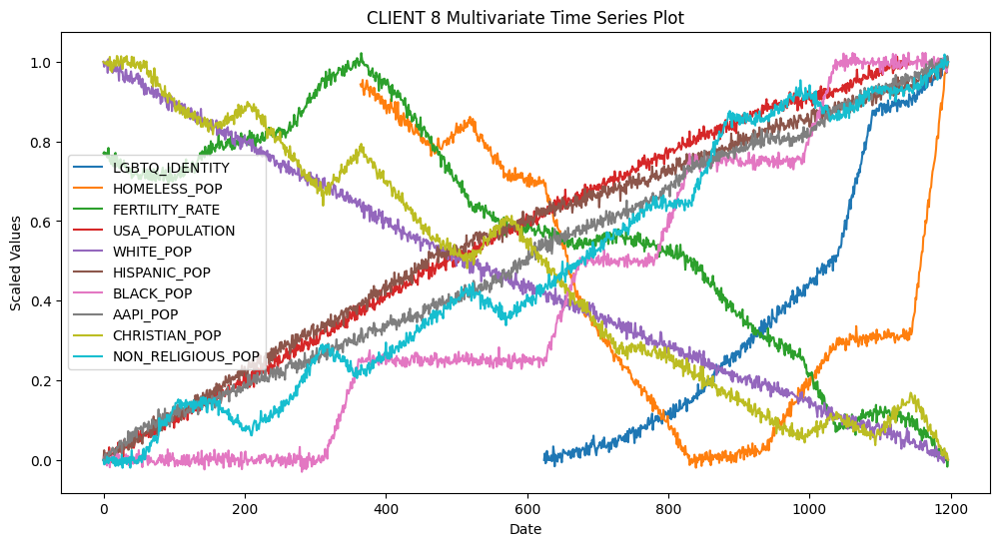

In [66]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 8 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [67]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT8_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT8_Noisy_Interpolated.xlsx


### CLIENT 9

In [68]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT9_DEFENSE', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  \
0  Week-1-Jan-2000         30.3        365348.0                     NaN   
1  Week-2-Jan-2000          NaN             NaN                     NaN   
2  Week-3-Jan-2000          NaN             NaN                     NaN   
3  Week-4-Jan-2000          NaN             NaN                     NaN   
4  Week-1-Feb-2000          NaN             NaN                     NaN   

   MIL_DEATHS  
0       832.0  
1         NaN  
2         NaN  
3         NaN  
4         NaN  


In [69]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0 2000-01-01         30.3        365348.0                     NaN       832.0
1 2000-01-02          NaN             NaN                     NaN         NaN
2 2000-01-03          NaN             NaN                     NaN         NaN
3 2000-01-04          NaN             NaN                     NaN         NaN
4 2000-02-01          NaN             NaN                     NaN         NaN


In [70]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0            30.3        365348.0                     NaN       832.0
1             NaN             NaN                     NaN         NaN
2             NaN             NaN                     NaN         NaN
3             NaN             NaN                     NaN         NaN
4             NaN             NaN                     NaN         NaN
...           ...             ...                     ...         ...
1295          NaN             NaN                     NaN         NaN
1296          NaN             NaN                     NaN         NaN
1297          NaN             NaN                     NaN         NaN
1298          NaN             NaN                     NaN         NaN
1299          NaN             NaN                     NaN         NaN

[1300 rows x 4 columns]


In [71]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [72]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0        0.060345        0.911036                     NaN    0.093671
1        0.060881        0.925541                     NaN    0.091258
2        0.050339        0.907444                     NaN    0.113566
3        0.049687        0.908705                     NaN    0.112894
4        0.059429        0.908205                     NaN    0.115465
...           ...             ...                     ...         ...
1295          NaN             NaN                     NaN         NaN
1296          NaN             NaN                     NaN         NaN
1297          NaN             NaN                     NaN         NaN
1298          NaN             NaN                     NaN         NaN
1299          NaN             NaN                     NaN         NaN

[1300 rows x 4 columns]


<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


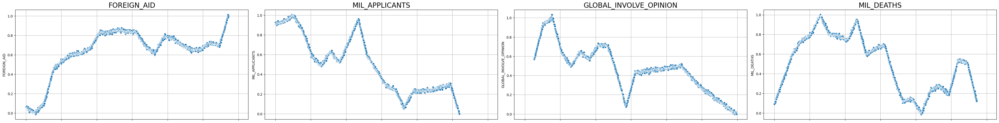

In [73]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

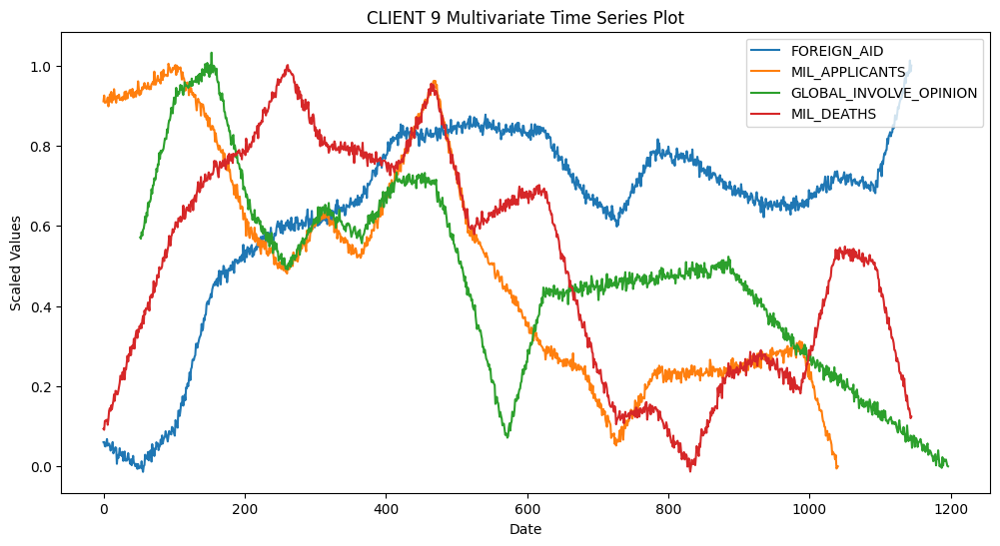

In [74]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 9 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [75]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT9_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT9_Noisy_Interpolated.xlsx


### CLIENT 10

In [76]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT10_INFRASTRUCTURE', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  GOOD_BRIDGES  UNSATIS_ROADS
0  Week-1-Jan-2000           NaN          17.39
1  Week-2-Jan-2000           NaN            NaN
2  Week-3-Jan-2000           NaN            NaN
3  Week-4-Jan-2000           NaN            NaN
4  Week-1-Feb-2000           NaN            NaN


In [77]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  GOOD_BRIDGES  UNSATIS_ROADS
0 2000-01-01           NaN          17.39
1 2000-01-02           NaN            NaN
2 2000-01-03           NaN            NaN
3 2000-01-04           NaN            NaN
4 2000-02-01           NaN            NaN


In [78]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      GOOD_BRIDGES  UNSATIS_ROADS
0              NaN          17.39
1              NaN            NaN
2              NaN            NaN
3              NaN            NaN
4              NaN            NaN
...            ...            ...
1295           NaN            NaN
1296           NaN            NaN
1297           NaN            NaN
1298           NaN            NaN
1299           NaN            NaN

[1300 rows x 2 columns]


In [79]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [80]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      GOOD_BRIDGES  UNSATIS_ROADS
0              NaN       0.254054
1              NaN       0.278506
2              NaN       0.248426
3              NaN       0.264545
4              NaN       0.236567
...            ...            ...
1295           NaN            NaN
1296           NaN            NaN
1297           NaN            NaN
1298           NaN            NaN
1299           NaN            NaN

[1300 rows x 2 columns]


<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


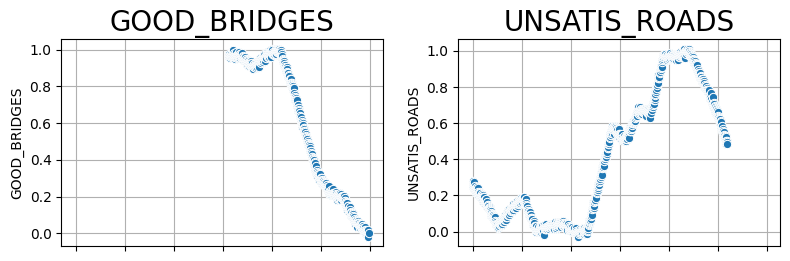

In [81]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

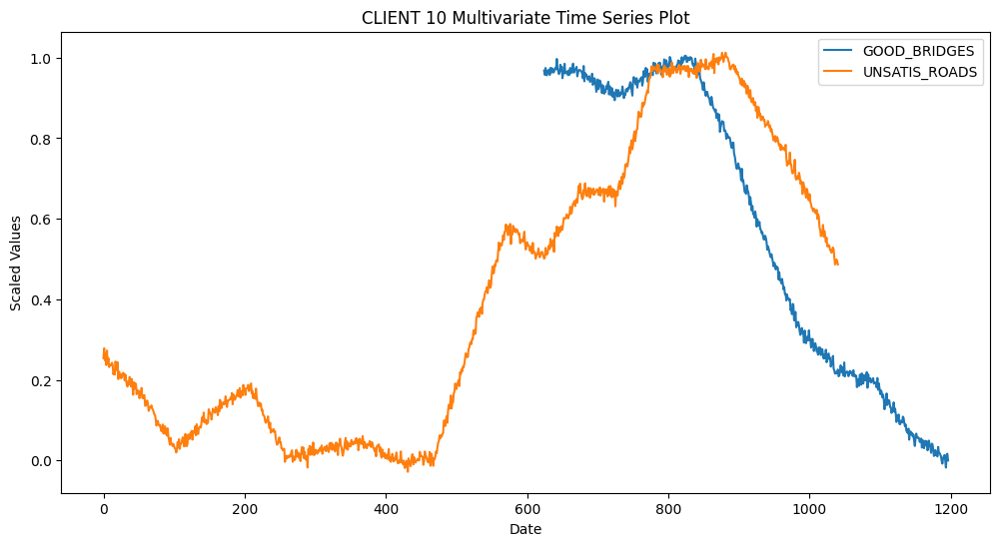

In [82]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 10 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [83]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT10_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT10_Noisy_Interpolated.xlsx


### CLIENT 11

In [84]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT11_CRIME', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  \
0  Week-1-Jan-2000              0.0          8543037.0     3793541.0   
1  Week-2-Jan-2000              NaN                NaN           NaN   
2  Week-3-Jan-2000              NaN                NaN           NaN   
3  Week-4-Jan-2000              NaN                NaN           NaN   
4  Week-1-Feb-2000              NaN                NaN           NaN   

   DOM_VIOLENCE_RATE  INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0                NaN             494.0            5.9                   NaN   
1                NaN               NaN            NaN                   NaN   
2                NaN               NaN            NaN                   NaN   
3                NaN               NaN            NaN                   NaN   
4                NaN               NaN            NaN                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN   

In [85]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  \
0 2000-01-01              0.0          8543037.0     3793541.0   
1 2000-01-02              NaN                NaN           NaN   
2 2000-01-03              NaN                NaN           NaN   
3 2000-01-04              NaN                NaN           NaN   
4 2000-02-01              NaN                NaN           NaN   

   DOM_VIOLENCE_RATE  INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0                NaN             494.0            5.9                   NaN   
1                NaN               NaN            NaN                   NaN   
2                NaN               NaN            NaN                   NaN   
3                NaN               NaN            NaN                   NaN   
4                NaN               NaN            NaN                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN                 NaN              NaN  

In [86]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0                 0.0          8543037.0     3793541.0                NaN   
1                 NaN                NaN           NaN                NaN   
2                 NaN                NaN           NaN                NaN   
3                 NaN                NaN           NaN                NaN   
4                 NaN                NaN           NaN                NaN   
...               ...                ...           ...                ...   
1295              NaN                NaN           NaN                NaN   
1296              NaN                NaN           NaN                NaN   
1297              NaN                NaN           NaN                NaN   
1298              NaN                NaN           NaN                NaN   
1299              NaN                NaN           NaN                NaN   

      INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0           

In [87]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [88]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0            0.000000           0.002840      0.100515                NaN   
1            0.021046          -0.023751      0.096047                NaN   
2           -0.003229          -0.002831      0.087167                NaN   
3            0.009859          -0.004116      0.083484                NaN   
4            0.006402          -0.011296      0.077313                NaN   
...               ...                ...           ...                ...   
1295              NaN                NaN           NaN                NaN   
1296              NaN                NaN           NaN                NaN   
1297              NaN                NaN           NaN                NaN   
1298              NaN                NaN           NaN                NaN   
1299              NaN                NaN           NaN                NaN   

      INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0           

<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


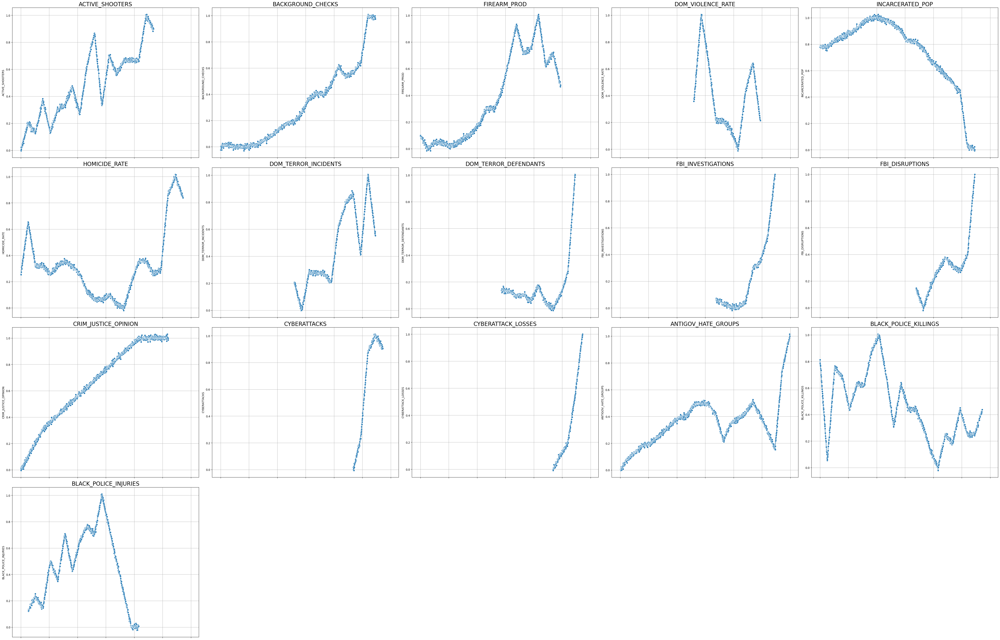

In [89]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

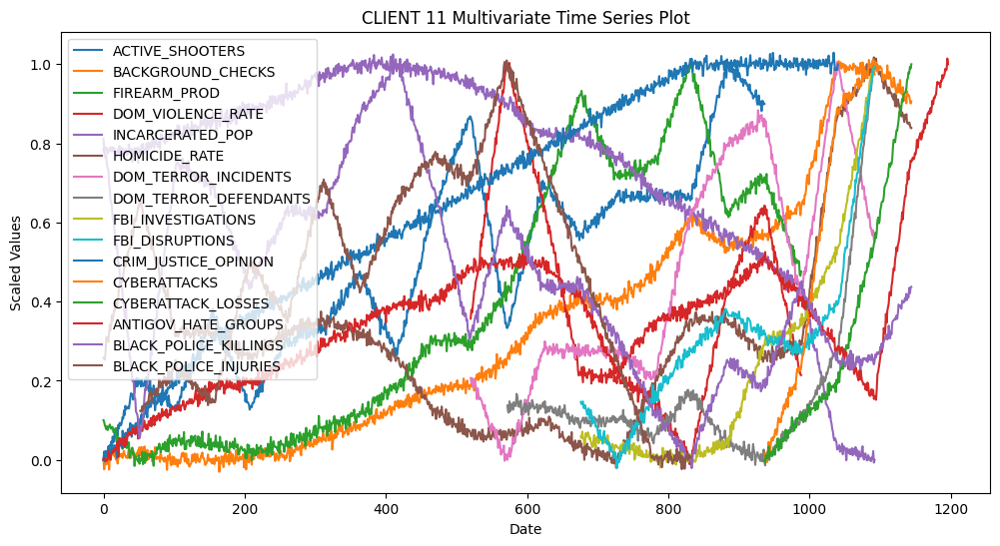

In [90]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 11 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [91]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT11_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT11_Noisy_Interpolated.xlsx


### CLIENT 12

In [92]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT12_AGRICULTURE', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  AGRI_SPENDING      FARMS  AGRI_SALES
0  Week-1-Jan-2000           2.08  2163739.6       322.2
1  Week-2-Jan-2000            NaN        NaN         NaN
2  Week-3-Jan-2000            NaN        NaN         NaN
3  Week-4-Jan-2000            NaN        NaN         NaN
4  Week-1-Feb-2000            NaN        NaN         NaN


In [93]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  AGRI_SPENDING      FARMS  AGRI_SALES
0 2000-01-01           2.08  2163739.6       322.2
1 2000-01-02            NaN        NaN         NaN
2 2000-01-03            NaN        NaN         NaN
3 2000-01-04            NaN        NaN         NaN
4 2000-02-01            NaN        NaN         NaN


In [94]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

      AGRI_SPENDING      FARMS  AGRI_SALES
0              2.08  2163739.6       322.2
1               NaN        NaN         NaN
2               NaN        NaN         NaN
3               NaN        NaN         NaN
4               NaN        NaN         NaN
...             ...        ...         ...
1295            NaN        NaN         NaN
1296            NaN        NaN         NaN
1297            NaN        NaN         NaN
1298            NaN        NaN         NaN
1299            NaN        NaN         NaN

[1300 rows x 3 columns]


In [95]:
# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

In [96]:
# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      AGRI_SPENDING     FARMS  AGRI_SALES
0          1.000000  0.747482    0.033151
1          0.988731  0.740141    0.039764
2          0.987283  0.738698    0.043071
3          0.996873  0.739819    0.022771
4          0.988274  0.751758    0.041346
...             ...       ...         ...
1295            NaN       NaN         NaN
1296            NaN       NaN         NaN
1297            NaN       NaN         NaN
1298            NaN       NaN         NaN
1299            NaN       NaN         NaN

[1300 rows x 3 columns]


<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


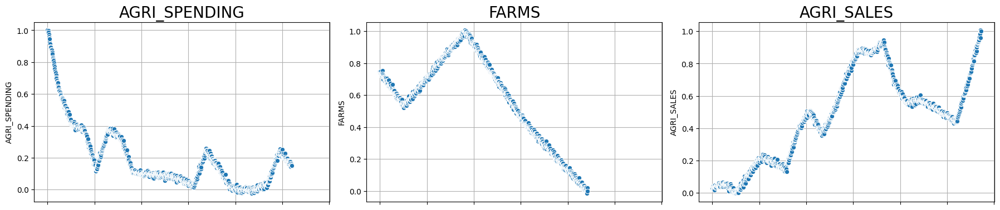

In [97]:
# Subplot comparison
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 7*len(filled_df_scaled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(filled_df_scaled.columns):
    sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(filled_df_scaled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

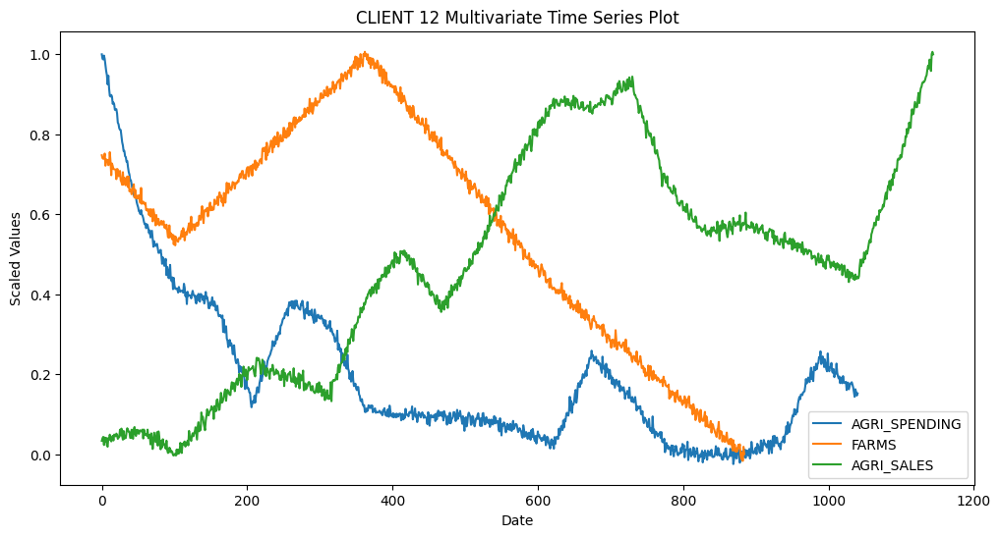

In [98]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in filled_df_scaled.columns:
    plt.plot(filled_df_scaled.index, filled_df_scaled[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 12 Multivariate Time Series Plot")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [99]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT12_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT12_Noisy_Interpolated.xlsx


### GLOBAL

In [100]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='GLOBAL', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  GOVT_SATISFACTION
0  Week-1-Jan-2000               69.0
1  Week-2-Jan-2000                NaN
2  Week-3-Jan-2000                NaN
3  Week-4-Jan-2000                NaN
4  Week-1-Feb-2000                NaN


In [101]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  GOVT_SATISFACTION
0 2000-01-01               69.0
1 2000-01-02                NaN
2 2000-01-03                NaN
3 2000-01-04                NaN
4 2000-02-01                NaN


In [102]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])
print(df_numeric)

# Scale the data
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), index=df.index, columns=df_numeric.columns)

# Apply fill_time_series to all scaled numeric columns
filled_df_scaled = fill_time_series(df_scaled)
print(filled_df_scaled)

      GOVT_SATISFACTION
0                  69.0
1                   NaN
2                   NaN
3                   NaN
4                   NaN
...                 ...
1295               19.0
1296                NaN
1297                NaN
1298                NaN
1299               19.5

[1300 rows x 1 columns]
      GOVT_SATISFACTION
0              0.984127
1              0.969936
2              0.978186
3              0.963311
4              0.956141
...                 ...
1295           0.190476
1296           0.186986
1297           0.197936
1298           0.194319
1299           0.198413

[1300 rows x 1 columns]


<ipython-input-6-1d4a61985534>:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_scaled[column].iloc[start_idx + 1:end_idx] = jagged_line[1:]  # Assign the jagged line to the DataFrame


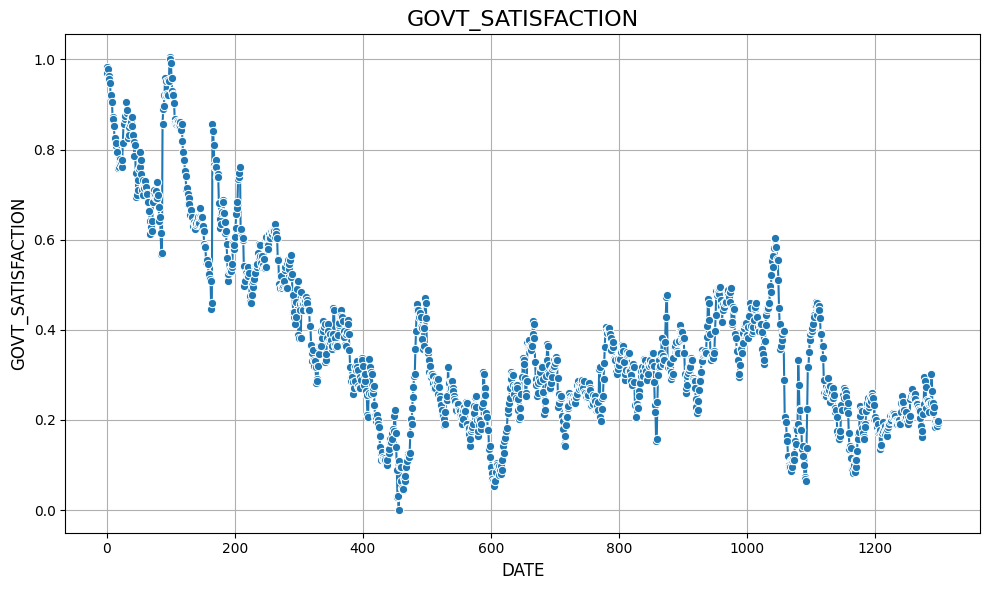

In [103]:
# Plot the global output 'GOVT_SATISFACTION' variable
plt.figure(figsize=(10, 6))
sns.lineplot(data=filled_df_scaled, x=filled_df_scaled.index, y='GOVT_SATISFACTION', marker='o')

# Customize plot
plt.title('GOVT_SATISFACTION', fontsize=16)
plt.xlabel('DATE', fontsize=12)
plt.ylabel('GOVT_SATISFACTION', fontsize=12)
plt.grid(True)

plt.tight_layout()
plt.show()

In [104]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_GLOBAL_Noisy_Interpolated.xlsx"

# Save DataFrame to Excel
filled_df_scaled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_GLOBAL_Noisy_Interpolated.xlsx


In [105]:
# End of code 3/5/25